## PW on graphcut optimization (binary case)
This session is divided into 3 parts: 


* a part on Bayesian classification (see PW1 and PW2)
* a part on object/background segmentation of a colour image with a CRF (conditional random filed)
* a part on the iterative segmentation of a textured image

We will use the PyMaxflow library for the calculation of the graphcut.

In [2]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt

import platform
import tempfile
import os
from scipy import ndimage as ndi
try:
    import maxflow # if not installed, install Maxflow
except:
    !pip install PyMaxflow # For Google Collab
    import maxflow


from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.io import output_notebook
output_notebook()

def affiche_pour_colab(im,MINI=None, MAXI=None,titre=''): #special colab, don't look
  def normalise_image_pour_bokeh(X,MINI,MAXI):
    if MAXI==None:
      MAXI = np.max(X)
    if MINI==None:
      MINI = np.min(X)
    imt=np.copy(X.copy())
    imt=(np.clip(imt,MINI,MAXI)/(MAXI-MINI))
    imt[imt<0]=0
    imt[imt>1]=1
    imt*=255
    sortie=np.empty((*imt.shape,4),dtype=np.uint8)
    for k in range(3):
      sortie[:,:,k]=imt
    sortie[:,:,3]=255
    return sortie

  img = im
  img=normalise_image_pour_bokeh(np.flipud(im),MINI,MAXI)
  p = figure(tooltips=[("x", "$x"), ("y", "$y"), ("value", "@image")], y_range=[im.shape[0], 0], x_range=[0, im.shape[1]], title=titre)
  # p.x_range.range_padding = p.y_range.range_padding = 0
  # must give a vector of images
  p.image(image=[np.flipud(im)], x=0, y=im.shape[0], dw=im.shape[1], dh=im.shape[0], palette="Greys9", level="image")
  p.xgrid.visible = False
  p.ygrid.visible = False
  showbokeh(p)

def affiche(im,MINI=0.0, MAXI=None,titre='',printname=False):
  affiche_pour_colab(im,MINI=MINI, MAXI=MAXI,titre=titre) # under google colab many options disappear

def display_segmentation_borders(image, bin):
    imagergb = np.copy(image)
    from skimage.morphology import binary_dilation, disk
    contour = binary_dilation(bin,disk(15))^bin
    imagergb[contour==1,0] = 255
    imagergb[contour==1,1] = 0
    imagergb[contour==1,2] = 0
    return imagergb

     |████████████████████████████████| 123 kB 5.4 MB/s 
  Created wheel for PyMaxflow: filename=PyMaxflow-1.2.13-cp37-cp37m-linux_x86_64.whl size=528305 sha256=977941cd51bdd84d35ada135751059e0da67423459f19944226eb1a99d75756c
  Stored in directory: /root/.cache/pip/wheels/62/f9/eb/62e4c1fcbee43e64b749674879fd3248d8c49f08c37c8a564d
Successfully built PyMaxflow


## Binary classification of a noisy image

You have a binary image *IoriginaleBW.png* (binary image of the two classes) and its observed version with a certain distribution of grey levels for each class *Iobservee.png*. The objective is to perform a two-class classification of this observed image (see PW1 and PW2). 

### Analysis of the distributions of the 2 classes of the image}


Q1: What are the distributions of the two classes of the image ($P(Y_s|X_s=0)$ (black class) and $P(Y_s|X_s=0)$ (white class))? 

Q2: Give the means and variances of the two classes.

*The distributions and the means and variances found in the previous sessions will be used without justification*.

**Your answer &#x270D;**

A1: The two classes (black class & white class ) of the image are gaussians.<br>
$P(Y_s|X_s=0)∝\exp( - \frac{( y_s-\mu_{0})^2}{2 \sigma^2}) $<br>
$P(Y_s|X_s=0)∝\exp( - \frac{( y_s-\mu_{1})^2}{2 \sigma^2})$


A2:from the last practical work, we assume that :<br>
Class0 : mean $μ_0=98$ and variance $σ_0²=500$<br>
Class1 : mean $μ_1=164$ and variance $σ_1²=500$

## 1.1: Graphcut optimization 

Q3: How many nodes does the graph have that is constructed for the search for the minimum capacity cut with only two neighbouring pixels? What do they correspond to? What do the data attachment terms in this graph correspond to and what values do they have for two observed pixels of values $y_s$ and $y_t$? What does the regularisation term correspond to?

**Your answer &#x270D;**

A3:

* We have 4 nodes in total, 2 nodes for the two neighbouring pixels and 2 nodes for the source and the target.


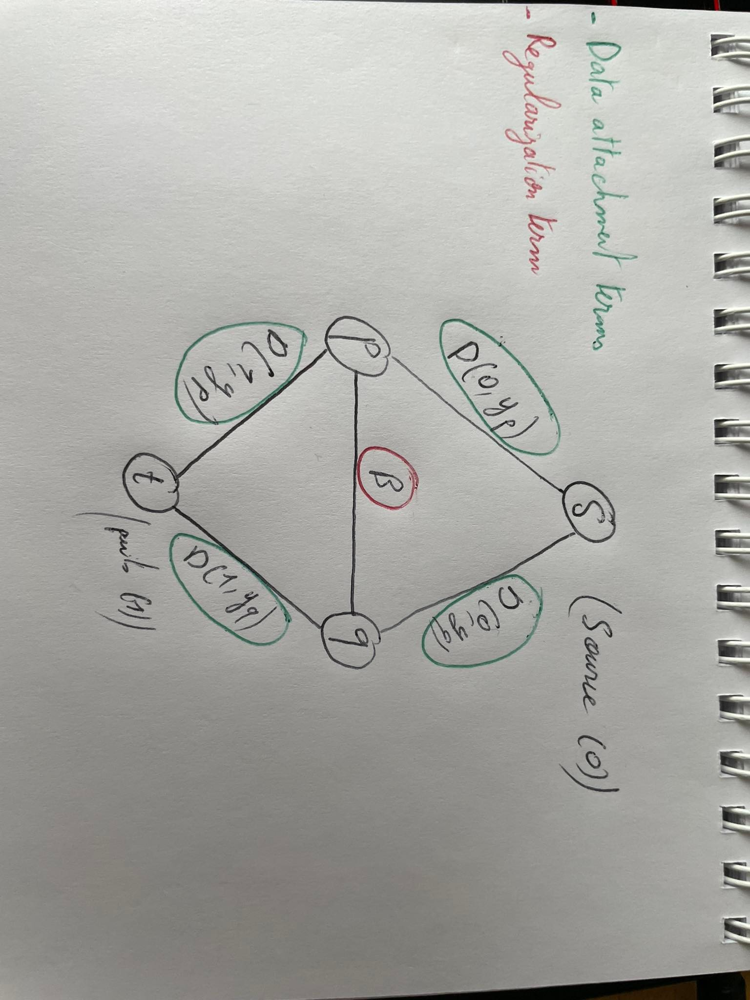

Q4: Complete the python code cell where it says "#TO BE COMPLETED EX1" with the data attachment and regularization terms as indicated. Run the minimum cut algorithm and view the result.

## 1.2 Searching for the optimal $\beta$.



Q5: By completing the program frame provided below, find the optimal $\beta$ value $\beta_{opt}$ using the "true image" $x$ corresponding to IoriginaleBW.png. You can plot the error values between $x$ and the estimated $\hat{x}$ to find $\beta_{opt}$. 



**Your answer &#x270D;**

A5:<br>
* By checking the plot of the error between $x$ and the estimated $\hat{x}$ to find $\beta_{opt}$.We can say that the best $\beta$ value is equal to 1850. 


Q6: What are the advantages of this optimization approach compared to ICM? Compared to simulated annealing? In theory, do we obtain the same result with both methods (simulated annealing and graphcut)? Under what conditions? What is the advantage of simulated annealing in the general case?

**Your answer &#x270D;**

A6: <br>
* First of all, the graph-cut optimization helps us to find the global minimum. While for the ICM optimization ( seen in the last practical work ), we don't guarantee to reach the global minimum ( we can reach a local minimum since it depends on the initialization ).
* The graph-cut guarantees having the global minimum like the simulated annealing optimization.However, the most important advantage of the graph-cut method is that the execution time is considerably lower than the SA method.
One of the disadvantages of the graph-cut optimization regarding the SA method is that it doesn't work with all energies as mentioned in the course.
* In theory, we can obtain the same result with both optimizations if we take the same initial image and also by choosing wisely a high temperature as initialization to SA method.
* In the general case , the SA optimization guarantees the global minimum even if we take negative values for $\beta$(it is not the case of the graphc-cut optimization).



Q7: How can you explain that the error rate with the true image can be lower with the simulated annealing result or the ICM than with the graph-cut optimisation? 
  

**Your answer &#x270D;**

A7: <br>
The error rate of with the true image can be lower with the simulated annealing result or the ICM than with the graph-cut optimisation because of the model. In fact, the model can be non efficient for the initial image wich generates a larger number of errors with the graph-cut method than the ICM or SA method.

Q8: What are the advantages and disadvantages of the Ising model?

**Your answer &#x270D;**

A8:<br>
* Advantages : The Ising model works efficiently when we have a low number of gray levels. It is an efficient model when it comes to images piecewise constants.
* Disadvantages : The Ising model don't take into consideration the differences between gray levels of pixels. It is an "all or nothing" model that can't regularize efficiently images.

In [3]:
# Loading images

im_obs=plt.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee.png')*255 # Observed image, noisy
im_orig=plt.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/IoriginaleBW.png') # Binary reference image, to assess the quality of the segmentation

affiche(im_obs,titre='Observed image')

In [4]:
#### to be completed
# TO BE COMPLETED EX1
beta = 1000 # beta value 
m0 = 98   # m0 and m1 values from the previous practical work
m1 = 164

## binary graph-cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation

# Add the nodes. 
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_obs.shape) 

# Add non-terminal edges with the same capacity.
# the edge has the value beta for all adjacent pixels in 4-connexity
g.add_grid_edges(nodeids, beta) 

# Add the terminal edges.
# the second argument correspond to the set of edge values to the source 
# the third argument correspond to the set of edge values to the sink
g.add_grid_tedges(nodeids, (im_obs-m0)**2, (im_obs-m1)**2) 

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1 
sgm = g.get_grid_segments(nodeids) 
im_bin = np.int_(np.logical_not(sgm))

affiche(im_bin,titre = "Result for beta = " + str(beta))
#%%


Max Flow: 68852909.0


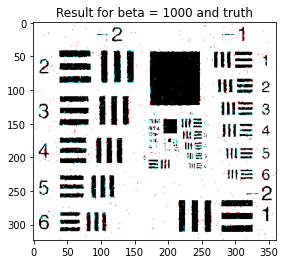

Number of misclassified pixels for beta =  1000 :  10


In [5]:
# compute the error image between im_bin and im_orig (the ideal solution) using np.abs and np.sum 
error = np.sum(np.abs((im_bin-im_orig)/255))

# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin, im_bin))*255)
plt.title("Result for beta = " + str(beta) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ",beta,": ",int(error))

### Search for the best parameter $\beta$

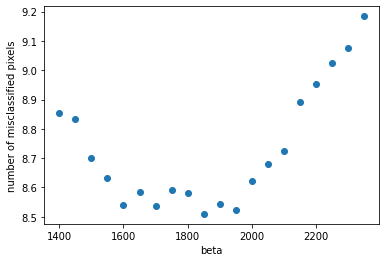

Best beta value:  1850


In [6]:
im_obs=plt.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee.png')*255 # Observed image, noisy
im_orig=plt.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/IoriginaleBW.png') # Binary reference image, to assess the quality of the segmentation

list_beta = []
list_errors = []

# TO BE COMPLETED - choose a range of values and a step to study beta
for beta in range(1400,2400,50):
    # TO BE COMPLETED
    m0 = 98
    m1 =164

    ## Binary graph cut

    # Create the graph
    g = maxflow.Graph[float]() # graph instantiation

    # Add the nodes. nodeids has the identifiers of the nodes in the grid.
    nodeids = g.add_grid_nodes(im_obs.shape) 
    # Add non-terminal edges with the same capacity.
    g.add_grid_edges(nodeids, beta) 
    # Add the terminal edges.
    g.add_grid_tedges(nodeids,(im_obs-m0)**2, (im_obs-m1)**2) 

    # Find the maximum flow.
    flow = g.maxflow()

    # Get the segments of the nodes in the grid.
    sgm = g.get_grid_segments(nodeids) 
    # create the output image 
    im_bin = np.int_(np.logical_not(sgm))

    # print("beta = ",beta)
    # compute the error
    error = np.sum(np.abs((im_bin-im_orig)/255))
    list_beta.append(beta)
    list_errors.append(error)

plt.figure()
plt.scatter(list_beta,list_errors)
plt.xlabel("beta")
plt.ylabel("number of misclassified pixels")
plt.show()

best_beta = list_beta[np.argmin(np.array(list_errors))]

print('Best beta value: ', best_beta)

## 2. Classification of a colour image

The objective of this part is to carry out an extension of the method seen previously in the case of the treatment of a colour image *avions.png* in which one wants to separate the objects from the background.

We will first use the same framework (Ising model) as before but with a three-dimensional data attachment (assuming convariance matrices equal to the identity). Then we will introduce a CRF (conditional random field) by weighting the regularisation term of the Ising model by the modulus of the gradient between two pixels of the observed image.  

### 2.1 Binary classification
From the program structure below, carry out the different steps necessary for this classification:
1. Modelling of the background and object distributions (in 3 dimensions this time)
1. Definition of the data attachment term
1. Choice of a value for the regularisation parameter for the Ising model
1. Finding the minimal cut to obtain the object/background classification.

Q9: Comment on these steps and the results obtained.

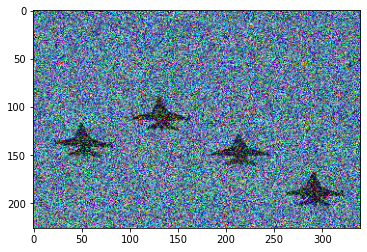

In [7]:
# Loading and displaying the image
im_obs=plt.imread('https://www.dropbox.com/s/ylm0ut8ipu5oonb/avions.png?dl=1')

plt.figure()
#plt.imshow(im_obs,vmin=0,vmax=255)
plt.rcParams['figure.figsize'] = [15, 15]
plt.imshow(im_obs)
plt.show()


# conversion of the image between 0 and 255
im_obs=255*im_obs

#### Determining the parameters of the classes


Plane class: we can use the values of the rectangle [180:200,280:300]. 

example np.mean(image[180:200,280:300,1]) returns the average of the selected area for channel 1

In [8]:
# mean of the plane class - 3D vector
m_planes = [np.mean(im_obs[180:200,280:300,i]) for i in range(3)]

# mean of the sky class
# you can use values in the following square [0:100,150:300]
m_sky = [np.mean(im_obs[10:150,10:300,i]) for i in range(3)]

print('For the sky, [R,G,B] = ', m_sky)
print("For the planes, [R,G,B] = ", m_planes)

# check that the obtained values are coherent

For the sky, [R,G,B] =  [93.16939, 125.00535, 153.172]
For the planes, [R,G,B] =  [53.645, 56.4725, 70.2075]


**Your answer &#x270D;**

A9:<br>


* while modelling of the background and object distributions (in 3 dimensions), we will suppose that they both follow a guassian distributions with the averages we can see above. 

* For the definition of the data attachment term, we consider that the 3 channels are independent. Which means that we will consider the following expression of energy for each class:<br>$$ U_s =  \sum\limits_{i=1}^3 {( y_{s,i}-\mu_{i})^2} $$
with

  *  i = the channel (R,G,B)
 
  *  $ \mu_{i} $ the mean for the $i^{th} $ channel 
  *  $ y_{s,i} $ is the gray level of the $i^{th}$ channel

In [29]:
# choose a beta value 
beta = 14000 # i did take this value after checking the next part to have an idea in which range we can find a good value of beta then i tried to run the algorithm with
#different values from 10k to 30k. while comparing the results i think 15000 is a good choice


# TO BE COMPLETED
## Binary graph-cut 
g = maxflow.Graph[float]()
# use the previous program to create the graph and compute the cut
# be careful of computing the terminal weights using the 3D values 
# you can compute 2 distance images with in each pixel the quadratic distance to the mean value 
# of each class 
nodeids = g.add_grid_nodes(im_obs.shape[0:2]) 
g.add_grid_edges(nodeids, beta)
g.add_grid_tedges(nodeids, np.sum((im_obs[:,:,i]-m_sky[i])**2 for i in range(3)), (np.sum((im_obs[:,:,i]-m_planes[i])**2 for i in range(3)))) 
flow = g.maxflow()
print("Max Flow:", str(flow))
sgm = g.get_grid_segments(nodeids) 
im_bin = np.int_(np.logical_not(sgm))
affiche(im_bin, titre="Result for beta = " + str(beta));

Max Flow: 1093432210.3283958


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  from ipykernel import kernelapp as app


### 2.2 Use of a CRF (Conditional Random Field) model

We will try here to adapt the model used previously to favour transitions where they are compatible with the gradient. To do this, we will replace the constant $\beta$ for the whole image by a "beta_field" which depends on the norm of the gradient.

Q10: Calculate and display the modulus of the gradient of the aircraft image after it has been grayscaled and convolved by a Gaussian kernel of standard deviation 1. Why use the "boundary='symm'" option when convolving through the Sobel filter? Try it without doing the Gaussian filtering. What is the point?

**Your answer &#x270D;**

A10:
* We use the "boundary='symm'" option when convolving through the Sobel filter to avoid the detection of false outlines.If we don't apply this option, we will detect the outlines on the edges of the image. 
* The image of the planes contains too much noise. If we calculate directly the gradient of the image, we will detect many false outlines. For this reason, we start by applying a gaussian filter.

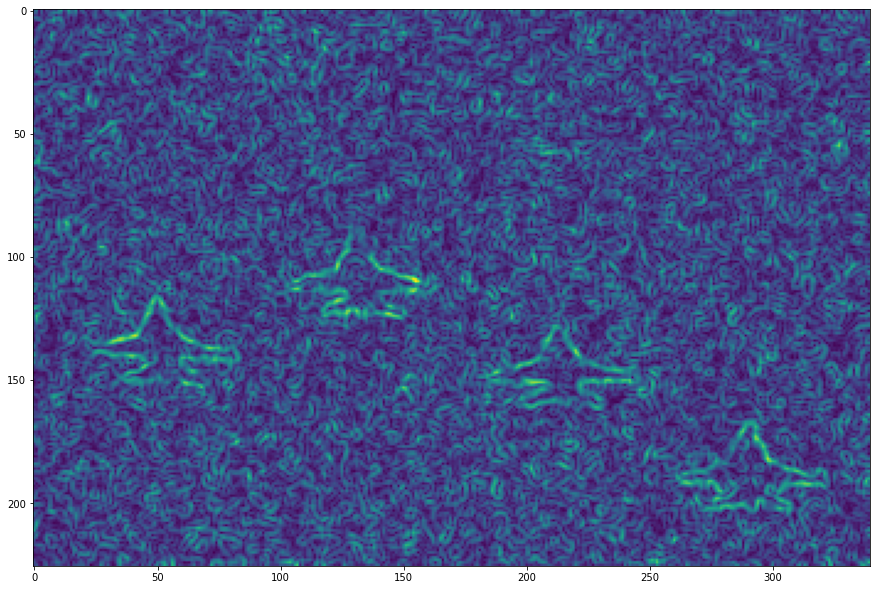

In [ ]:
import scipy.signal
import scipy.ndimage
from skimage import color

def gradient(image):
    """ Array -> tuple[Array*Array]"""
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype = np.float)
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype = np.float)
    # to be completed
    # use mode = 'same' and boundary='symm' in scipy.signal.convolve2d
    derivative_x = scipy.signal.convolve2d(image,sobel_x,mode='same',boundary='symm')
    derivative_y = scipy.signal.convolve2d(image,sobel_y,mode='same',boundary='symm')
    return([derivative_x,derivative_y])

plane_nb = scipy.ndimage.gaussian_filter(color.rgb2gray(im_obs), 1)
plane_x, plane_y = gradient(plane_nb)
# calculation of the gradient modulus 
grad_av = np.sqrt(plane_x**2 + plane_y**2)
plt.figure()
plt.imshow(grad_av)
plt.show()


Complete the code for segmentation by CRF. We will choose $beta\_field=\beta_2\cdot\exp(-grad\_av/h)$ We can use $h=300$ and $\beta_2=20000$. Also replace the constant beta by the field "beta_field" during the "g.add_grid_edges" step.

Q11: Compare the results with and without the contour term.

In [ ]:
# calculation of beta_field 
# this field will set the value for the 4-neighbours 
h = 300
beta2 = 20000
beta_field = beta2 * np.exp(-grad_av/h)

## Binary graph cut
# complete by taking your previous code and replacing 
# beta by beta_field in the line g.add_grid_edges
g = maxflow.Graph[float]()
nodeids = g.add_grid_nodes(im_obs.shape[0:2])
g.add_grid_edges(nodeids, beta_field) 
g.add_grid_tedges(nodeids, np.sum((im_obs[:,:,i]-m_sky[i])**2 for i in range(3)), (np.sum((im_obs[:,:,i]-m_planes[i])**2 for i in range(3)))) 
flow = g.maxflow()
print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids) # Returns 1 if the pixel is on the drain side after calculating the min cut, 0 if it is on the source side
im_bin = np.int_(np.logical_not(sgm))

affiche(im_bin, titre="Result for the CRF model")

Max Flow: 1090936581.922484


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  del sys.path[0]


In [ ]:
# Without the CRF

h = 300
beta2 = 20000
g = maxflow.Graph[float]() 
nodeids = g.add_grid_nodes(im_obs.shape[0:2])
g.add_grid_edges(nodeids, beta2) 
g.add_grid_tedges(nodeids, np.sum((im_obs[:,:,i]-m_sky[i])**2 for i in range(3)), (np.sum((im_obs[:,:,i]-m_planes[i])**2 for i in range(3)))) 
flow = g.maxflow()

print("Max Flow:", str(flow))

sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

affiche(im_bin, titre="Result without the CRF model")

Max Flow: 1098152994.5268364


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  


**Your answer &#x270D;**

A11:

*  If we compare the results with and without the "CRF model", we will surely notice that the edges of the planes are more respected while using the CRF model.
* While having the contour term, the regularization term tends to 0 when we have a new region. Thanks to this, we guarantee better results regarding the respect of the edges.<br>
=> This explains the results we obtained. 

## 3. Iterative Segmentation with Gaussian Mixture

Q12: Display the "zebra" image below. Is it possible to segment the zebra with the method used to segment the planes?



**Your answer &#x270D;**

A12:<br>
Its is surely possible to segment the zebra with the graph-cut method but not exactly the way we did with the planes. In this images we have more than two different regions. To segment this image, we need more than one source node and one target node.

uint8


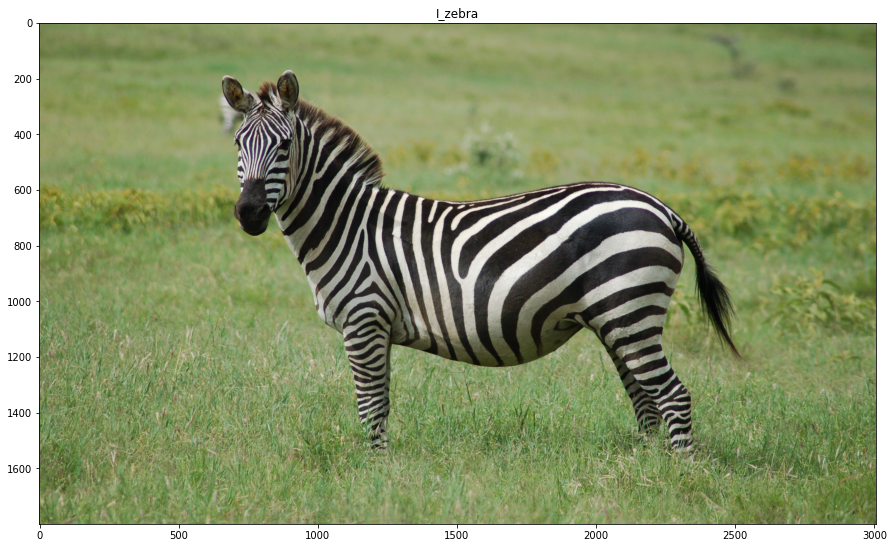

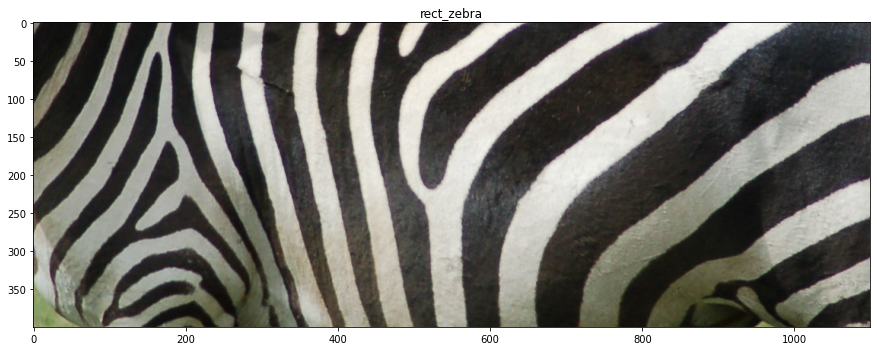

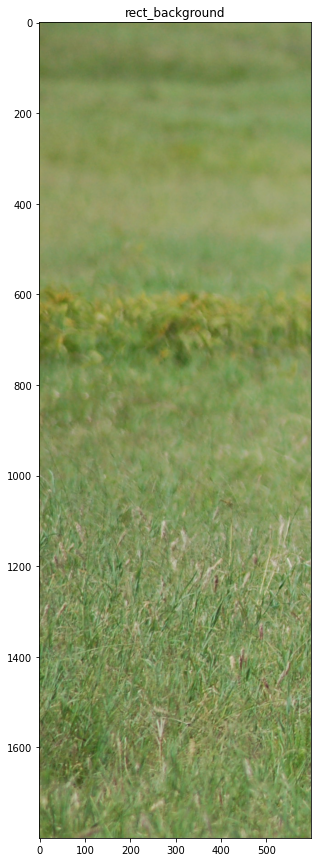

In [10]:
### Loading a new image
import imageio
I_zebra = imageio.imread('https://upload.wikimedia.org/wikipedia/commons/6/60/Equus_quagga.jpg')
I_zebra = I_zebra[200:,:,:]
rect_zebra = I_zebra[700:1100,1000:2100]
rect_background = I_zebra[:,0:600]
print(I_zebra.dtype)

plt.figure()
plt.imshow(I_zebra)
plt.title('I_zebra')
plt.show()

plt.figure()
plt.imshow(rect_zebra)
plt.title('rect_zebra')
plt.show()

plt.figure()
plt.imshow(rect_background)
plt.title('rect_background')
plt.show()

Q13: Calculate the covariance matrix for the rect_zebra and the rect_background. Display the values and comment on the result. What do the diagonal values correspond to?

**Your answer &#x270D;**

A13:
<br> The diagonal terms correspond to the variances of the 3 channels (R,G,B)


In [11]:
print(I_zebra.shape)
V_tulip = np.vstack([I_zebra[:,:,i].flatten() for i in range(3)])
print(I_zebra.shape)

M_cov = np.cov(np.vstack([I_zebra[:,:,i].flatten() for i in range(3)]))
print('Full zebra image')
print(M_cov)

M_cov = np.cov(np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]))
print('Rectangle zebra')
print(M_cov)

M_cov = np.cov(np.vstack([rect_background[:,:,i].flatten() for i in range(3)]))
print('Rectangle background')
print(M_cov)

(1800, 3008, 3)
(1800, 3008, 3)
Full zebra image
[[1506.72829498 1532.31063252 1229.07656578]
 [1532.31063252 1691.94506099 1220.3208793 ]
 [1229.07656578 1220.3208793  1210.38796242]]
Rectangle zebra
[[5504.24135104 5535.45173735 5287.6066819 ]
 [5535.45173735 5589.55992729 5327.41135684]
 [5287.6066819  5327.41135684 5140.71619284]]
Rectangle background
[[314.66520718 225.26933203 255.5870428 ]
 [225.26933203 219.9126776  221.64616138]
 [255.5870428  221.64616138 309.65375015]]


Q14: Display the histogram for the R, G and B channels for the "rect_zebra" image. Comment on the result. 

**Your answer &#x270D;**

A14:<br>
* After displaying the histograms of the "rect_zebra" image for the 3 channels, we notice that we have two spikes around the values (30-45) and (215-245).<br>
We can say that we have two classes.
* the histograms of the background class are gaussians.

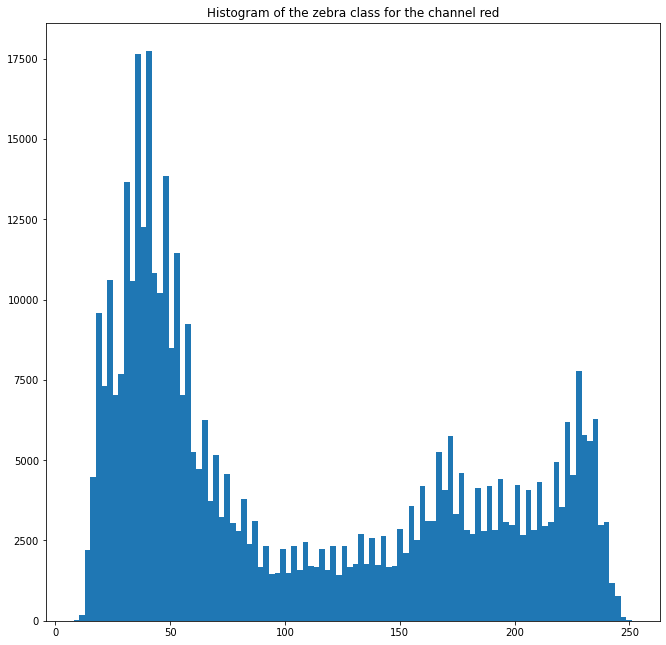

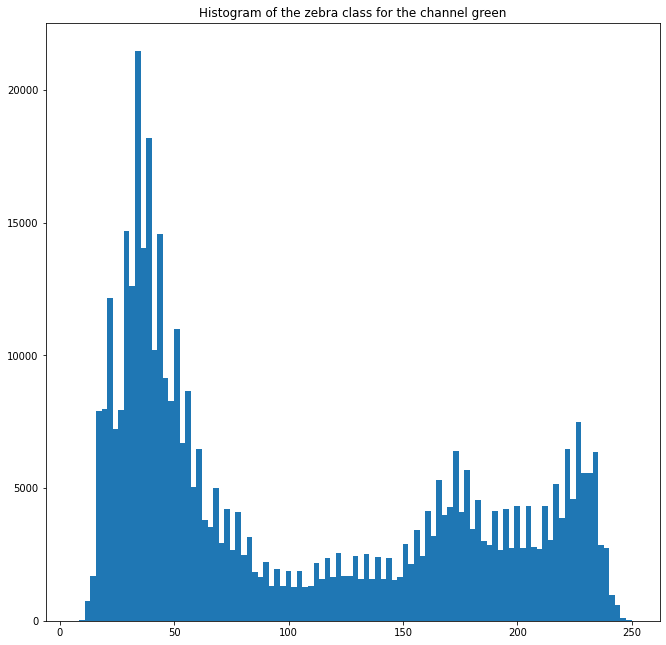

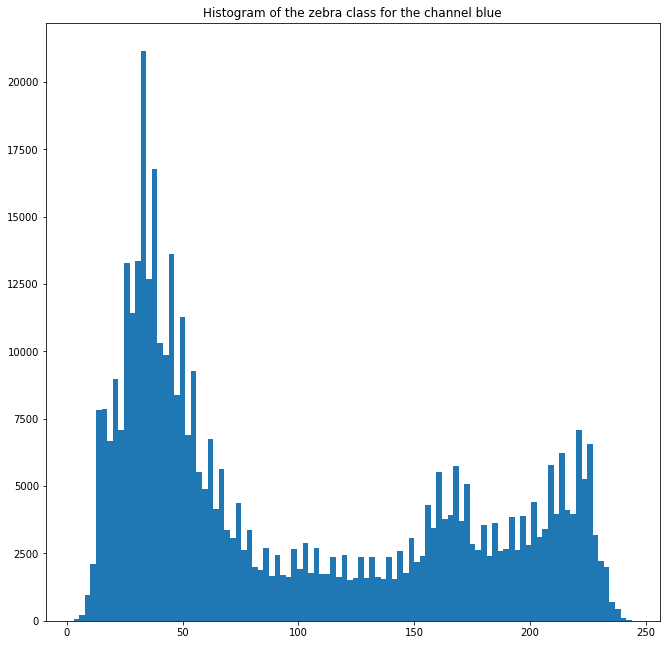

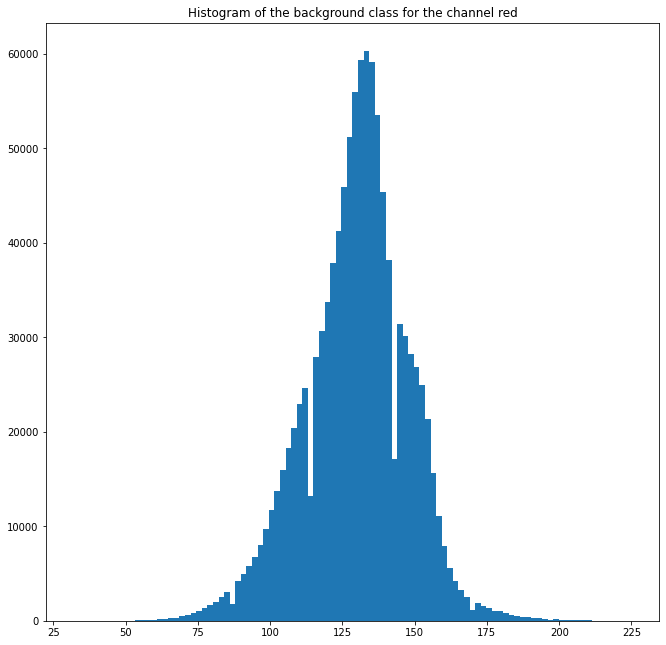

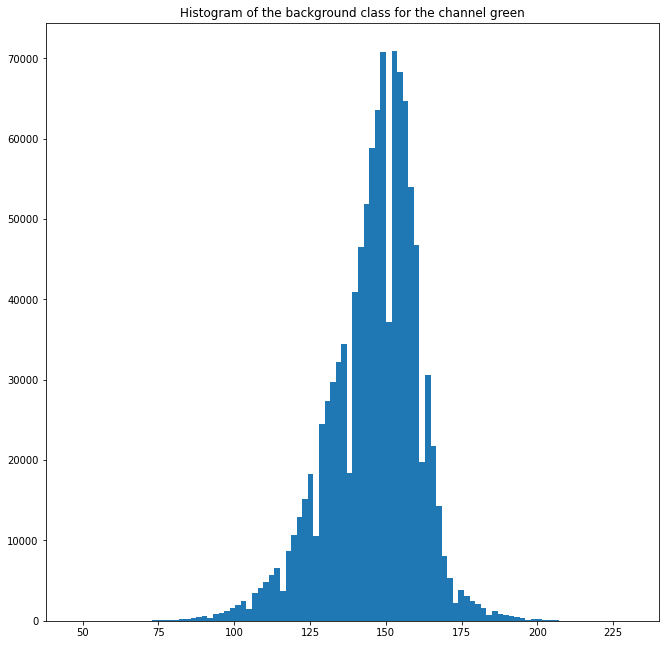

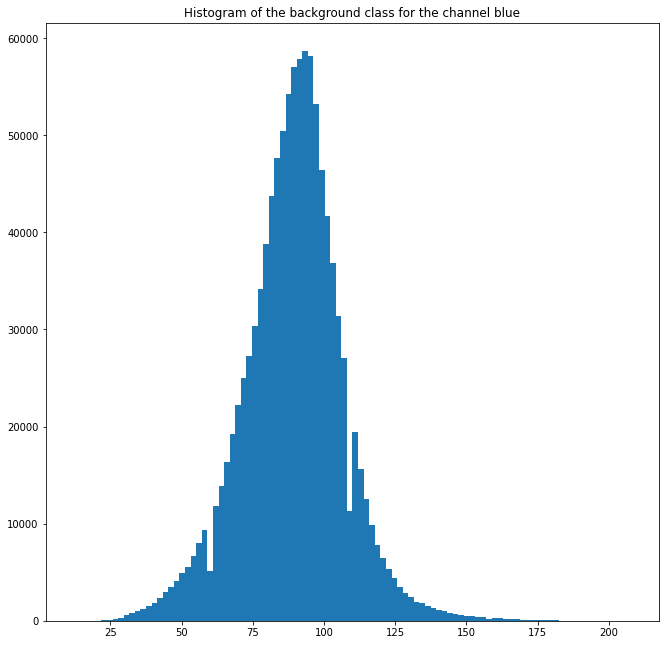

In [12]:
# allows you to change the display size of plt.show
plt.rcParams['figure.figsize'] = [11, 11]

nomchan = ["red","green", "blue"]
for chan in range(3):
    plt.figure()
    plt.hist(rect_zebra[:,:,chan].flatten(),100)
    plt.title("Histogram of the zebra class for the channel " + nomchan[chan])
    plt.show()
    
    
for chan in range(3):
    plt.figure()
    plt.hist(rect_background[:,:,chan].flatten(),100)
    plt.title("Histogram of the background class for the channel " + nomchan[chan])
    plt.show()

Q15: Propose an algorithmic method to identify the two classes of the image "rect_zebra". Use a sklearn implementation of this algorithm to identify the mean vectors ($m_R$,$m_G$,$m_B$) for two classes of the "rect_zebra" image and two classes of the "rect_background" image.

*The following line of code can be used to transform the image into a suitable form.*

X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()

Comment on the average vectors obtained. They can be displayed as an image using the code provided.

**Your answer &#x270D;**

A15:<br>
We can use the K-means algorithm to identify the two classes of the the "rect_zebra" and "rect_background" images.

In [13]:
# computation of class parameters in a semi-automatic way
from sklearn.cluster import KMeans
import numpy as np

# use a number of classes =2 for the zebra part (complete n_clusters=?)
X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_zebra = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_zebra = kmeans_zebra.cluster_centers_

# use a number of classes =2 for the background part
X = np.vstack([rect_background[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_background = KMeans(n_clusters=2, random_state=0).fit(X)
mean_vectors_background = kmeans_background.cluster_centers_

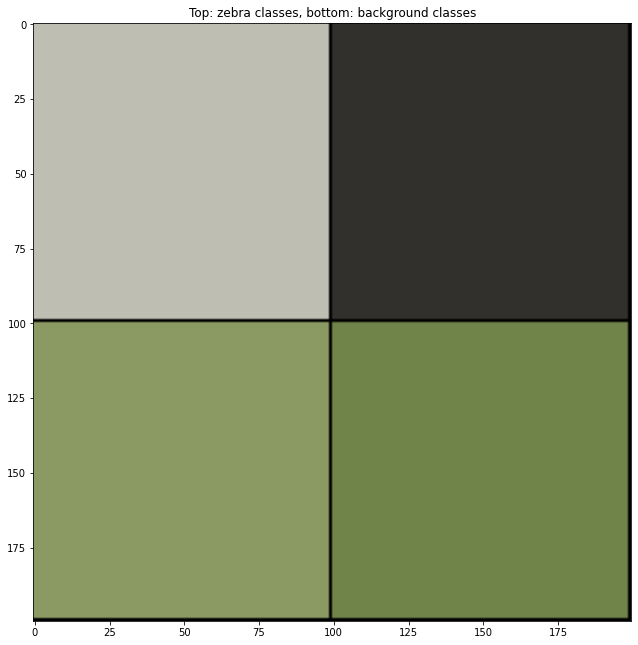

In [14]:
# display of the class centers found as an image
image_mean_vectors = np.zeros((200,200,3),np.uint8)
for i in range(3):
    image_mean_vectors[0:99,0:99,i] = mean_vectors_zebra[0,i]
    image_mean_vectors[0:99,100:199,i] = mean_vectors_zebra[1,i]
    image_mean_vectors[100:199,0:99,i] = mean_vectors_background[0,i]
    image_mean_vectors[100:199,100:199,i] = mean_vectors_background[1,i]

plt.figure()
plt.imshow(image_mean_vectors,vmax = 255)
plt.title("Top: zebra classes, bottom: background classes")
plt.show()

Q16: Display separately two neg-log-likelihood images (the neg-log-likelihood was used as a data attachment in the previous example) for the two zebra classes.
Build a neg-log-likelihood image corresponding to the minimum of the two neg-log-likelihoods of the zebra classes. Similarly for the background class. 

Display them and comment.

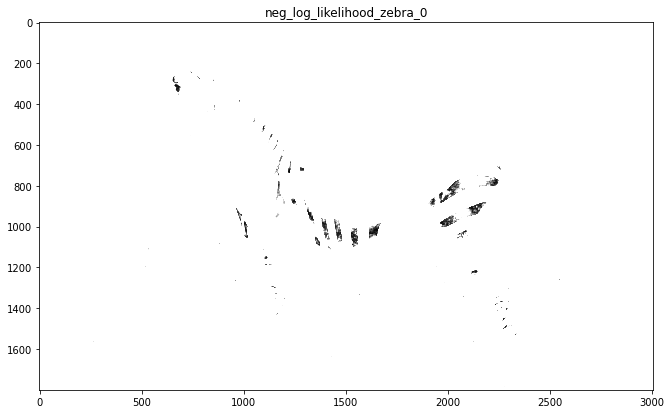

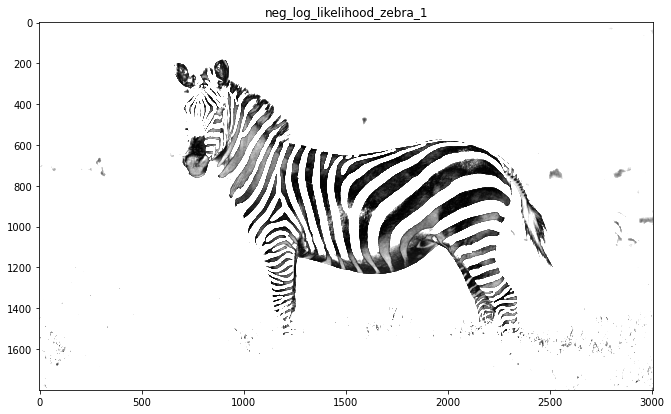

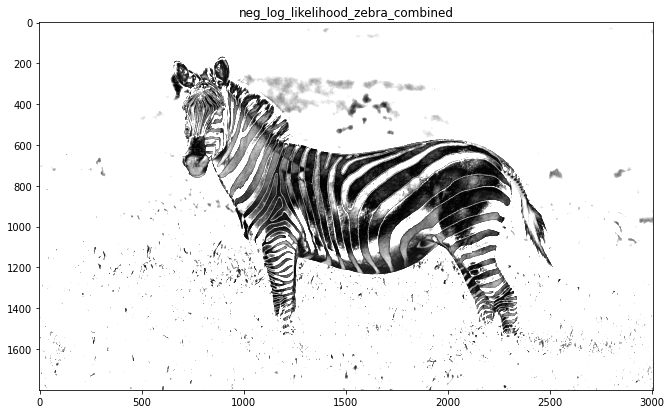

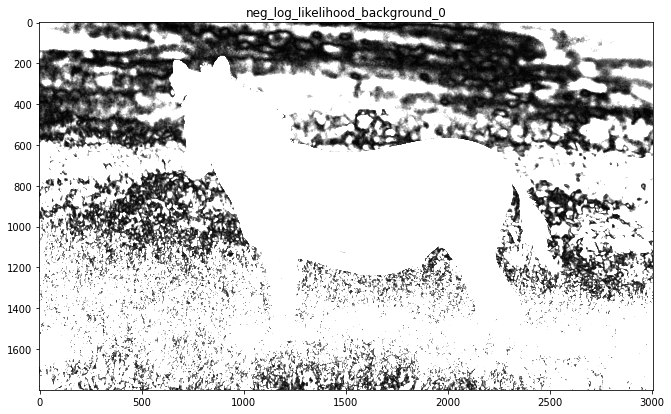

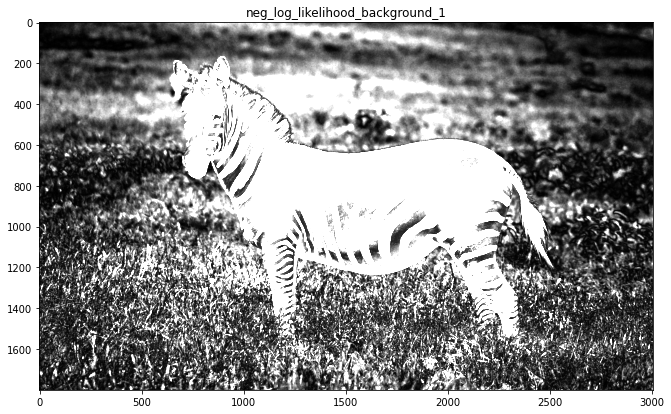

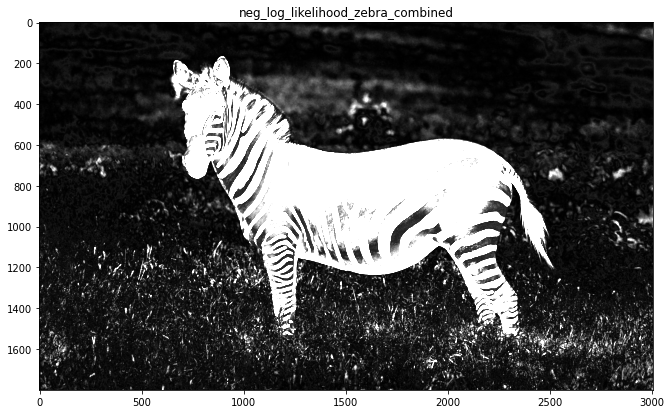

In [15]:
# calculation of the neg-log-likelihood of the zebra class
neg_log_likelihood_zebra_0 = sum((I_zebra[:,:,i]-mean_vectors_zebra[0,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_0,cmap='gray', vmax = 600)
plt.title("neg_log_likelihood_zebra_0")
plt.show()

neg_log_likelihood_zebra_1 = sum((I_zebra[:,:,i]-mean_vectors_zebra[1,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_1")
plt.show()

neg_log_likelihood_zebra_combined = np.minimum(sum((I_zebra[:,:,i]-mean_vectors_zebra[0,i])**2 for i in range(3)),sum((I_zebra[:,:,i]-mean_vectors_zebra[1,i])**2 for i in range(3)))

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_combined")
plt.show()

# TO BE COMPLETED
# calculate the neg-log-likelihood of the background 
# call the output neg_log_likelihood_background_combined
neg_log_likelihood_background_0 = sum((I_zebra[:,:,i]-mean_vectors_background[0,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_background_0,cmap='gray', vmax = 600)
plt.title("neg_log_likelihood_background_0")
plt.show()

neg_log_likelihood_background_1 = sum((I_zebra[:,:,i]-mean_vectors_background[1,i])**2 for i in range(3))

plt.figure()
plt.imshow(neg_log_likelihood_background_1,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_background_1")
plt.show()


neg_log_likelihood_background_combined = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_background[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_background))]),2)

plt.figure()
plt.imshow(neg_log_likelihood_background_combined,cmap='gray', vmax = 5000)
plt.title("neg_log_likelihood_zebra_combined")
plt.show()





**Your answer &#x270D;**

A16:

* The results of the "neg_log_likelihood_zebre_0" and "neg_log_likelihood_zebre_1" images shows a dark color when we detect the presence of a certain class.<br>
* We notice that when we combine the two images of the zebra class, we well represent the whole zebra.
* for the background image, we notice that the class number 1 of the zebra is present in those images.
* We can think maybe of a higher number of classes to improve those results for the background image.

Q17: From these combined data attachment images (one for the background and one for the zebra), set up a graph-cut segmentation of the image with the $\beta$ of your choice. Comment the result.

**Your answer &#x270D;**

A17:<br>
* While considering the fact that we are only using two classes, we can say that we have acceptable results.
* If we want to improve those results, we can use a higher number of classes to ensure a better segmentation(that includes the bottom part of the zebra paws).

**In the next cell, i didn't manage to create the algorithm that finds the optimal value of beta like we did in the first part.**<br>
**While checking the results, i tried to raise each time the value of beta to achieve a picture where we are satisfied by the segmentation.**

Max Flow: 7421042345.89686


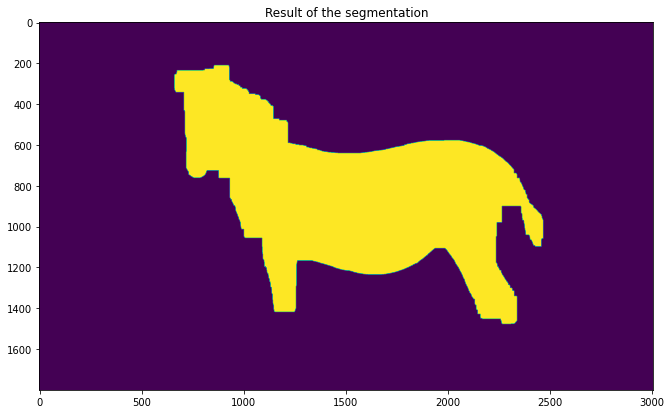

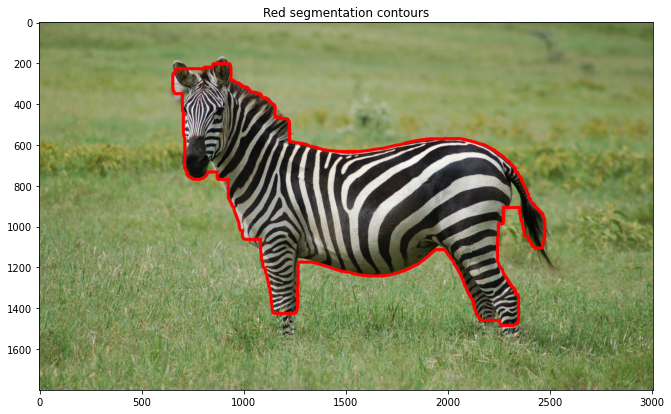

In [25]:
beta =270000  # Optimal beta value to be determined

## Binary graph cut

# Create the graph.
g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2]) # Create a grid with a non-terminal node for each pixel in the image
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta) # Addition of a beta weight edge between each adjacent node according to the 4-connexity
# Add the terminal edges.

# TO BE COMPLETED
g.add_grid_tedges(nodeids, neg_log_likelihood_background_combined, neg_log_likelihood_zebra_combined) 


# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids) 
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin)
plt.title("Result of the segmentation")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()

Q18: From the obtained segmentation, determine the mean vectors for 5 classes for the background and 5 classes for the zebra. Use these lists of mean vectors to construct new neg-log-likelihood combination images. Comment on them.

**Your answer &#x270D;**

A18:

* Using 5 classes, we can obviously see that we have better results regarding the background image since we can see the different parts of the grass.
* When it comes to the zebra class, it is clear that we see more details of the zebra clearly but we also have to mention that some parts of the background became included in the zebra class.

In [26]:
# The computing of this cell can take several minutes.

X_1 = np.vstack([I_zebra[im_bin==1,i].flatten() for i in range(3)]).transpose()
kmeans_zebra2 = KMeans(n_clusters=5, random_state=0).fit(X_1)
mean_vectors_zebra2 = kmeans_zebra2.cluster_centers_

X_2 = np.vstack([I_zebra[im_bin==0,i].flatten() for i in range(3)]).transpose()
kmeans_background2 = KMeans(n_clusters=5, random_state=0).fit(X_2)
mean_vectors_background2 = kmeans_background2.cluster_centers_

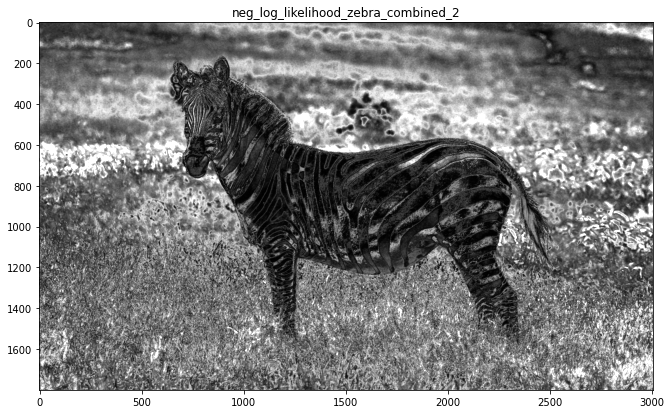

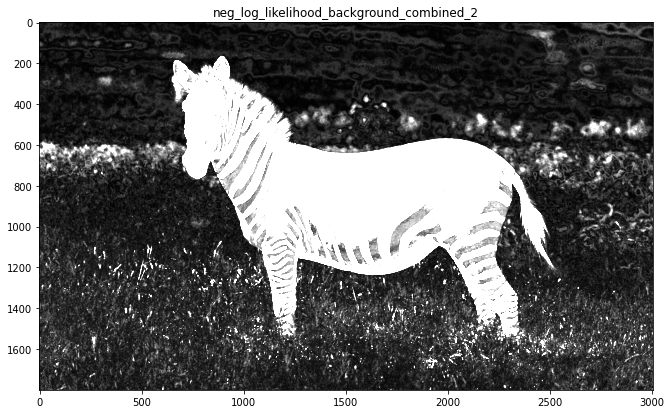

In [27]:
neg_log_likelihood_zebra_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_zebra2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_zebra2))]),2)

neg_log_likelihood_background_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_background2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_background2))]),2)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined_2 ,cmap='gray', vmax = 3000)
plt.title("neg_log_likelihood_zebra_combined_2")
plt.show()

plt.figure()
plt.imshow(neg_log_likelihood_background_combined_2,cmap='gray', vmax = 1000)
plt.title("neg_log_likelihood_background_combined_2")
plt.show()


Q19: From these neg-log-likelihood images, segment the image by graph-cut using a new value of $\beta$ that gives you the best result. Comment on the result and the new value of $\beta$ that allowed you to obtain it. What about the new 5-class data attachment compared to the previous one?

**Your answer &#x270D;**

A19:<br>
* Using the 5 class segmentation for the zebra image and the background image, we clearly improved the result of segmentation. All the segmentation contours are well represented.
* for the new value of $β$, we can see that it is so much lower than the one we used with 2 classes.


Max Flow: 1486376930.3552277


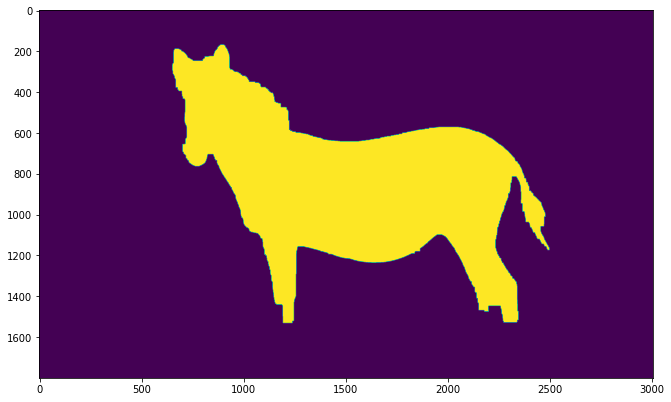

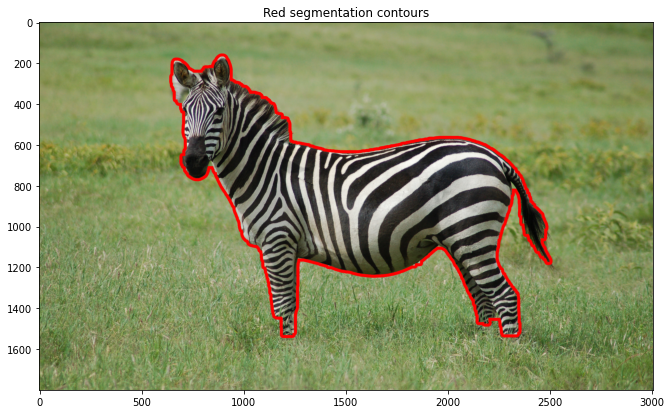

In [28]:
beta = 14000 # Optimal beta value to be determined
#i took a beta in the same range of the beta i chose in the beginning and i found out that it gives a good segmentation.
g = maxflow.Graph[float]() # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2]) 
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta)
# Add the terminal edges.
g.add_grid_tedges(nodeids,neg_log_likelihood_background_combined_2, neg_log_likelihood_zebra_combined_2) 

flow = g.maxflow()

print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids) # Returns 1 if the pixel is on the drain side after calculation of the min cut, 0 if it is on the source side
im_bin = np.int_(np.logical_not(sgm))

affiche(im_bin, titre="Result for beta = " + str(beta))

plt.figure()
plt.imshow(im_bin)
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()

**Since i tried to implement the function that gives you the optimal value of beta for a colour image without succeeding, could you please send me the function so i can check it ?**
* my Email is : mohamed.baccari@telecom-paris.fr